=== UCF Sports Action Dataset + OWL-ViT + SAM Pipeline ===
=== Loading UCF Sports Dataset ===


\

Opening dataset in read-only mode as you don't have write permissions.


\

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/activeloop/ucf-sports-action



|

hub://activeloop/ucf-sports-action loaded successfully.



Dataset loaded: 17270 total samples
Total samples: 17270
Original class names from dataset: ['SkateBoarding-Front', 'Golf-Swing-Front', 'Lifting', 'Walk-Front', 'Golf-Swing-Side', 'Run-Side', 'Riding-Horse', 'Swing-SideAngle', 'Kicking-Front', 'Swing-Bench', 'Diving-Side', 'Kicking-Side', 'Golf-Swing-Back']
Original classes: 13 -> Grouped classes: 10
Grouped class names: ['Diving', 'Golf-Swing', 'Kicking', 'Lifting', 'Riding-Horse', 'Run', 'SkateBoarding', 'Swing-Bench', 'Swing-SideAngle', 'Walk']
Original to grouped mapping: {0: 6, 1: 1, 2: 3, 3: 9, 4: 1, 5: 5, 6: 4, 7: 8, 8: 2, 9: 7, 10: 0, 11: 2, 12: 1}
Using GROUPED classes for training: ['Diving', 'Golf-Swing', 'Kicking', 'Lifting', 'Riding-Horse', 'Run', 'SkateBoarding', 'Swing-Bench', 'Swing-SideAngle', 'Walk']
Reduced from 13 to 10 classes
Label name to ID mapping: {'Diving': 0, 'Golf-Swing': 1, 'Kicking': 2, 'Lifting': 3, 'Riding-Horse': 4, 'Run': 5, 'SkateBoarding': 6, 'Swing-Bench': 7, 'Swing-SideAngle': 8, 'Walk': 9}
Label 

/home/sbeeredd/miniconda3/envs/env/lib/python3.11/site-packages/deeplake/core/dataset/dataset.py:642: UserWarning: Indexing by integer in a for loop, like `for i in range(len(ds)): ... ds[i]` can be quite slow. Use `for i, sample in enumerate(ds)` instead.
  warnings.warn(


All grouped labels: [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6

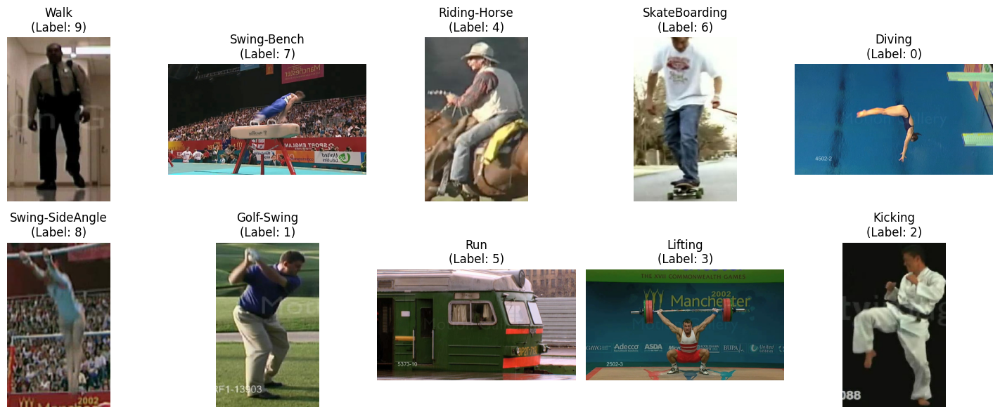

Dataset setup complete! Ready for OWL-ViT + SAM processing...


In [30]:
# UCF Sports Action Dataset + OWL-ViT + SAM Pipeline
print("=== UCF Sports Action Dataset + OWL-ViT + SAM Pipeline ===")

import sys
import os
from PIL import Image
import torch
import torchvision.transforms as transforms
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Import OWL-ViT and SAM
from transformers import OwlViTProcessor, OwlViTForObjectDetection
from segment_anything import SamPredictor, sam_model_registry

# Import UCF Sports dataset utilities
import deeplake
sys.path.append('..')  # Add parent directory to path
from ucf_action_utils import UCFSportsDataset, get_ucf_sports_transforms

print("=== Loading UCF Sports Dataset ===")

# Load UCF Sports dataset
ds = deeplake.load('hub://activeloop/ucf-sports-action')
print(f"Dataset loaded: {len(ds)} total samples")

# Create transforms
transform = get_ucf_sports_transforms()

# Create test dataset (using test split for demonstration)
testset = UCFSportsDataset(ds, split='test', transform=transform, use_grouped_classes=True)
print(f"Test dataset created with {len(testset)} samples")

# Get class information
class_names = testset.get_all_class_names()
num_classes = testset.get_num_classes()
print(f"Classes ({num_classes}): {class_names}")

# Get one sample per class for demonstration
print("\n=== Collecting One Sample Per Class ===")
samples_per_class = {}

# Collect one sample per class
for idx in range(len(testset)):
    # Get the actual sample to determine its class
    sample = ds[testset.indices[idx]]
    original_label = int(sample.labels.numpy()[0])
    
    if testset.use_grouped_classes:
        grouped_label = testset.original_to_grouped_id.get(original_label, -1)
        class_label = grouped_label
    else:
        class_label = original_label
    
    class_name = testset.get_class_name(class_label)
    
    # If we haven't collected a sample for this class yet, store it
    if class_name not in samples_per_class and class_label != -1:
        samples_per_class[class_name] = {
            'idx': idx,
            'class_label': class_label,
            'original_image': np.array(sample.images.numpy())
        }
        print(f"Collected sample for {class_name} (label: {class_label})")
    
    # Stop when we have one sample per class
    if len(samples_per_class) >= num_classes:
        break

print(f"\nCollected {len(samples_per_class)} samples for classes: {list(samples_per_class.keys())}")

# Display collected samples
print("\n=== Sample Overview ===")
n_samples = len(samples_per_class)
cols = min(5, n_samples)
rows = (n_samples + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 3*rows))
if rows == 1:
    axes = [axes] if n_samples == 1 else axes
else:
    axes = axes.flatten()

for i, (class_name, sample_info) in enumerate(samples_per_class.items()):
    if i < len(axes):
        axes[i].imshow(sample_info['original_image'])
        axes[i].set_title(f"{class_name}\n(Label: {sample_info['class_label']})")
        axes[i].axis('off')

# Hide unused subplots
for i in range(len(samples_per_class), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print("Dataset setup complete! Ready for OWL-ViT + SAM processing...")


=== Step 1: OWL-ViT Object Detection ===
Loading OWL-ViT model...


/home/sbeeredd/miniconda3/envs/env/lib/python3.11/site-packages/huggingface_hub/file_download.py:945: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


OWL-ViT model loaded on device: cuda
Text queries prepared for 10 classes

Processing Walk...
Making text queries: ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing walking']
  Found 1 boxes for Walk
  Detected: ['human body'] (conf: ['0.12'])

Processing Swing-Bench...
Making text queries: ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing swing bench']


/tmp/ipykernel_179421/145420377.py:53: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  pil_image = Image.fromarray(original_image, mode='RGB')
/home/sbeeredd/miniconda3/envs/env/lib/python3.11/site-packages/transformers/models/owlvit/image_processing_owlvit.py:355: FutureWarning: `post_process` is deprecated and will be removed in v5 of Transformers, please use `post_process_object_detection`
  warnings.warn(


  Found 0 boxes for Swing-Bench

Processing Riding-Horse...
Making text queries: ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing riding horse']
  Found 2 boxes for Riding-Horse
  Detected: ['person', 'human body'] (conf: ['0.12', '0.12'])

Processing SkateBoarding...
Making text queries: ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing skateboarding']
  Found 2 boxes for SkateBoarding
  Detected: ['person', 'human body'] (conf: ['0.10', '0.16'])

Processing Diving...
Making text queries: ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing diving']
  Found 2 boxes for Diving
  Detected: ['human body', 'human body'] (conf: ['0.14', '0.19'])

Processing Swing-SideAngle...
Making text queries: ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing swing side angle']
  Found 0 boxes for Swing-SideAngle

Processing Golf-Swing...
Making text q

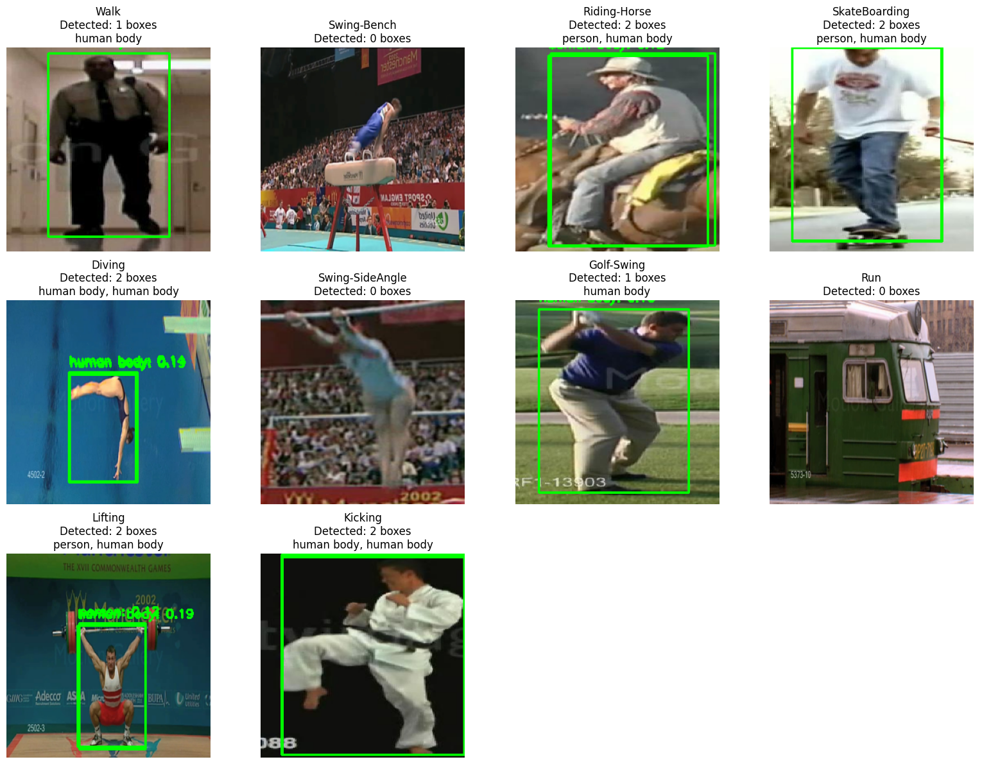

In [31]:
# Step 1: OWL-ViT Object Detection for All Classes
print("=== Step 1: OWL-ViT Object Detection ===")

# Initialize OWL-ViT model and processor
print("Loading OWL-ViT model...")
owlvit_model = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")
owlvit_processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
owlvit_model = owlvit_model.to(device)
owlvit_model.eval()

print(f"OWL-ViT model loaded on device: {device}")

# Create text queries for UCF Sports classes
# We'll create more descriptive queries that should work better with OWL-ViT
# text_queries_mapping = {
#     'Diving': ['person diving', 'diver', 'human diving into water', 'olympic diving'],
#     'Golf-Swing': ['person playing golf', 'golfer', 'human swinging golf club'],
#     'Kicking': ['person kicking', 'taekwondo', 'Human kicking'],
#     'Lifting': ['person lifting weights', 'weightlifter', 'human exercising', 'olympic lifting'],
#     'Riding-Horse': ['person riding horse', 'horse rider', 'equestrian', 'person on a horse'],
#     'Run': ['person running', 'runner', 'human jogging'],
#     'SkateBoarding': ['person skateboarding', 'skateboarder', 'human on skateboard'],
#     'Swing-Bench': ['person exercising', 'human on bench', 'weightlifter', 'olympic lifting'],
#     'Swing-SideAngle': ['person swinging', 'human exercising', 'athlete', 'person swinging a bat', 'baseball player'],
#     'Walk': ['person walking', 'human walking', 'pedestrian', 'Human']
# }
text_queries_mapping = {
    'Diving': ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing diving'],
    'Golf-Swing':['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing golf swing'],
    'Kicking':['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing kicking'],
    'Lifting': ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing lifting'],
    'Riding-Horse':['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing riding horse'],
    'Run': ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing running'],
    'SkateBoarding': ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing skateboarding'],
    'Swing-Bench': ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing swing bench'],
    'Swing-SideAngle': ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing swing side angle'],
    'Walk': ['human', 'person', 'people', 'body', 'human body', 'human being', 'human being', 'doing walking']
}

print(f"Text queries prepared for {len(text_queries_mapping)} classes")

# Process each sample through OWL-ViT
processed_samples = {}

for class_name, sample_info in samples_per_class.items():
    print(f"\nProcessing {class_name}...")
    
    # Get original image and resize to 256x256
    original_image = sample_info['original_image']
    pil_image = Image.fromarray(original_image, mode='RGB')
    resized_image = pil_image.resize((256, 256))
    resized_image_np = np.array(resized_image)
    
    # Get text queries for this class
    text_queries = text_queries_mapping.get(class_name, [f"person {class_name.lower()}", "human", "athlete"])
    
    print(f"Making text queries: {text_queries}")
    
    # Process image and text inputs
    inputs = owlvit_processor(text=text_queries, images=resized_image, return_tensors="pt").to(device)
    
    # Get predictions
    with torch.no_grad():
        outputs = owlvit_model(**inputs)
    
    # Post-process to get boxes in original image coordinates
    target_sizes = torch.Tensor([resized_image.size[::-1]]).to(device)  # (height, width)
    results = owlvit_processor.post_process(outputs=outputs, target_sizes=target_sizes)
    
    # Extract results
    boxes = results[0]["boxes"].cpu().numpy()
    scores = results[0]["scores"].cpu().numpy()
    labels = results[0]["labels"].cpu().numpy()
    
    # Filter by confidence threshold
    confidence_threshold = 0.1
    valid_indices = scores >= confidence_threshold
    
    boxes = boxes[valid_indices]
    scores = scores[valid_indices]
    labels = labels[valid_indices]
    
    # Convert boxes from [x0, y0, x1, y1] to [x0, y0, x1, y1] format (already in correct format)
    detected_classes = [text_queries[label] for label in labels]
    
    # Create annotated image
    annotated_image_np = resized_image_np.copy()
    if len(boxes) > 0:
        for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
            x0, y0, x1, y1 = box.astype(int)
            cv2.rectangle(annotated_image_np, (x0, y0), (x1, y1), (0, 255, 0), 2)
            cv2.putText(annotated_image_np, f"{text_queries[label]}: {score:.2f}", 
                       (x0, y0-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    # Store processed results
    processed_samples[class_name] = {
        'original_image': original_image,
        'resized_image_np': resized_image_np,
        'resized_image_pil': resized_image,
        'boxes': boxes.tolist(),  # Convert to list for consistency
        'confidences': scores.tolist(),
        'class_names_detected': detected_classes,
        'annotated_image_np': annotated_image_np,
        'class_label': sample_info['class_label'],
        'text_queries': text_queries
    }
    
    print(f"  Found {len(boxes)} boxes for {class_name}")
    if len(boxes) > 0:
        print(f"  Detected: {detected_classes} (conf: {[f'{c:.2f}' for c in scores]})")

print(f"\nOWL-ViT processing complete for {len(processed_samples)} classes!")

# Visualize OWL-ViT detection results for all classes
print("\n=== OWL-ViT Detection Results ===")
n_classes = len(processed_samples)
cols = min(4, n_classes)
rows = (n_classes + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(16, 4*rows))
if rows == 1:
    axes = [axes] if n_classes == 1 else axes
else:
    axes = axes.flatten()

for i, (class_name, sample_data) in enumerate(processed_samples.items()):
    if i < len(axes):
        axes[i].imshow(sample_data['annotated_image_np'])
        title = f"{class_name}\nDetected: {len(sample_data['boxes'])} boxes"
        if sample_data['boxes']:
            title += f"\n{', '.join(sample_data['class_names_detected'][:2])}"
        axes[i].set_title(title)
        axes[i].axis('off')

# Hide unused subplots
for i in range(len(processed_samples), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [32]:
# Step 2: SAM Segmentation using OWL-ViT Detections
print("=== Step 2: SAM Segmentation ===")

# SAM model configuration
model_type = "vit_b"
if model_type == "vit_h":
    checkpoint_path = "../checkpoints/SAM/sam_vit_h_4b8939.pth"
elif model_type == "vit_l":
    checkpoint_path = "../checkpoints/SAM/sam_vit_l_0b3195.pth"
else:  # vit_b
    checkpoint_path = "../checkpoints/SAM/sam_vit_b_01ec64.pth"

# Initialize SAM
sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
sam.cuda()
predictor = SamPredictor(sam)

print(f"SAM model ({model_type}) initialized successfully!")

# Process each sample through SAM
for class_name, sample_data in processed_samples.items():
    print(f"\nProcessing SAM segmentation for {class_name}...")
    
    # Set image for SAM predictor - this is crucial!
    predictor.set_image(sample_data['resized_image_np'])
    
    # Use SAM to segment using OWL-ViT bounding boxes
    if len(sample_data['boxes']) > 0:
        # Use the first detected box and convert to numpy array
        # Convert from [x0, y0, x1, y1] to [x0, y0, x1, y1] format (already correct)
        input_box = np.array(sample_data['boxes'][0])
        
        masks, scores, logits_sam = predictor.predict(
            point_coords=None,
            point_labels=None,
            box=input_box,
            multimask_output=True,
        )
        
        # Select the best mask
        best_mask_idx = np.argmax(scores)
        best_mask = masks[best_mask_idx]
        
        print(f"  Generated {len(masks)} masks, best score: {scores[best_mask_idx]:.3f}")
        print(f"  Mask coverage: {np.sum(best_mask) / (best_mask.shape[0] * best_mask.shape[1]):.1%}")
        
    else:
        # No boxes found, generate mask without prompt
        print("  No bounding boxes available, generating mask without prompt...")
        masks, scores, logits_sam = predictor.predict(
            point_coords=None,
            point_labels=None,
            multimask_output=True,
        )
        
        if len(masks) > 0:
            best_mask_idx = np.argmax(scores)
            best_mask = masks[best_mask_idx]
            print(f"  Generated {len(masks)} masks without prompt")
        else:
            print("  No masks generated, using full image")
            best_mask = np.ones_like(sample_data['resized_image_np'][:,:,0])  # Use full image as fallback
    
    # Store SAM results
    sample_data['masks'] = masks if 'masks' in locals() else []
    sample_data['mask_scores'] = scores if 'scores' in locals() else []
    sample_data['best_mask'] = best_mask
    sample_data['best_mask_idx'] = best_mask_idx if 'best_mask_idx' in locals() else 0

print(f"\nSAM segmentation complete for {len(processed_samples)} classes!")


=== Step 2: SAM Segmentation ===


SAM model (vit_b) initialized successfully!

Processing SAM segmentation for Walk...
  Generated 3 masks, best score: 0.939
  Mask coverage: 42.7%

Processing SAM segmentation for Swing-Bench...
  No bounding boxes available, generating mask without prompt...
  Generated 3 masks without prompt

Processing SAM segmentation for Riding-Horse...
  Generated 3 masks, best score: 0.943
  Mask coverage: 50.3%

Processing SAM segmentation for SkateBoarding...
  Generated 3 masks, best score: 0.977
  Mask coverage: 47.4%

Processing SAM segmentation for Diving...
  Generated 3 masks, best score: 0.982
  Mask coverage: 3.5%

Processing SAM segmentation for Swing-SideAngle...
  No bounding boxes available, generating mask without prompt...
  Generated 3 masks without prompt

Processing SAM segmentation for Golf-Swing...
  Generated 3 masks, best score: 0.976
  Mask coverage: 36.4%

Processing SAM segmentation for Run...
  No bounding boxes available, generating mask without prompt...
  Generated 


=== SAM Segmentation Results ===


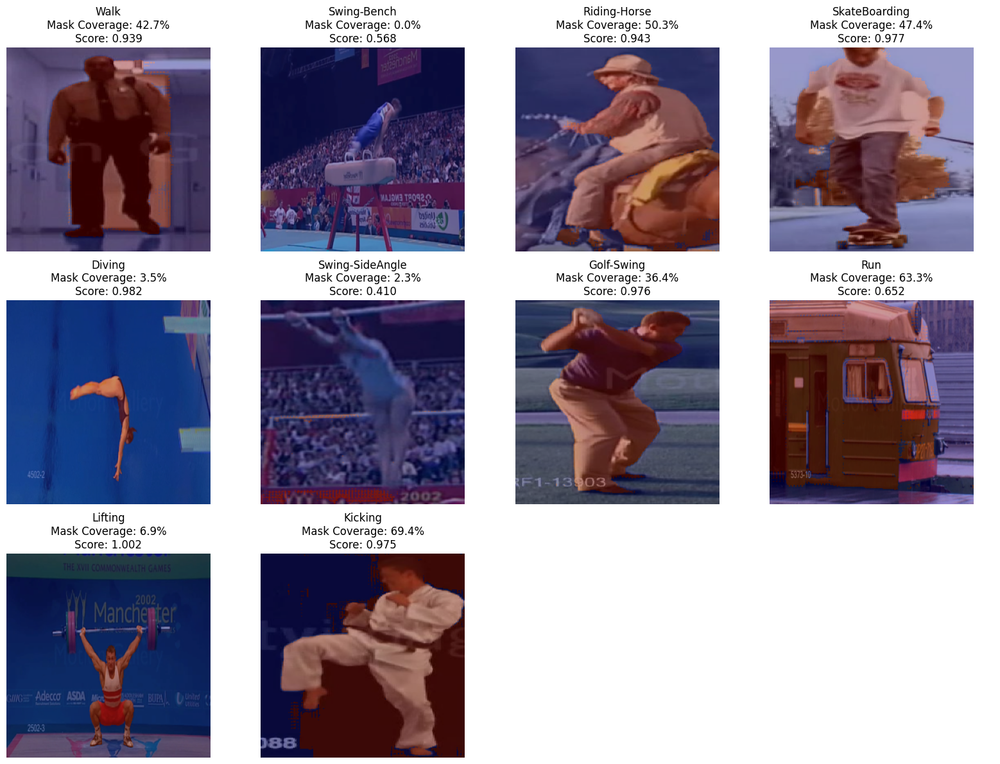

In [33]:
# Visualize SAM segmentation results
print("\n=== SAM Segmentation Results ===")
n_classes = len(processed_samples)
cols = min(4, n_classes)
rows = (n_classes + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(16, 4*rows))
if rows == 1:
    axes = [axes] if n_classes == 1 else axes
else:
    axes = axes.flatten()

for i, (class_name, sample_data) in enumerate(processed_samples.items()):
    if i < len(axes):
        # Show mask overlay on original image
        axes[i].imshow(sample_data['resized_image_np'])
        axes[i].imshow(sample_data['best_mask'], alpha=0.4, cmap='jet')
        
        coverage = np.sum(sample_data['best_mask']) / sample_data['best_mask'].size
        title = f"{class_name}\nMask Coverage: {coverage:.1%}"
        if 'mask_scores' in sample_data and len(sample_data['mask_scores']) > 0:
            title += f"\nScore: {sample_data['mask_scores'][sample_data['best_mask_idx']]:.3f}"
        axes[i].set_title(title)
        axes[i].axis('off')

# Hide unused subplots
for i in range(len(processed_samples), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


=== Detailed SAM Mask Visualization ===

Detailed masks for Walk:


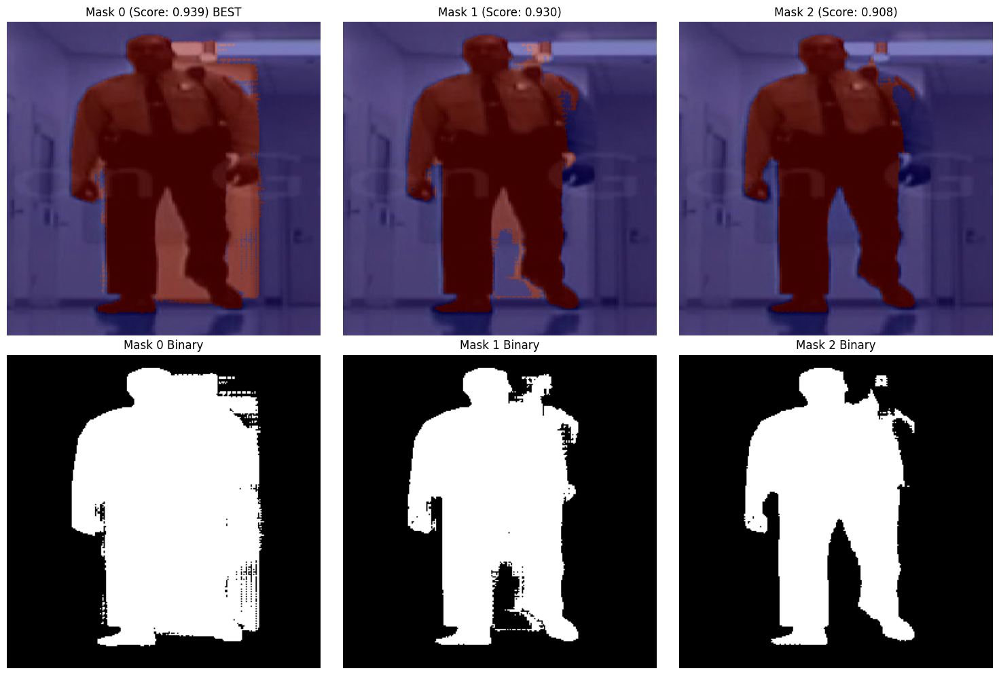

Best mask for Walk: index 0 with score 0.939

Detailed masks for Swing-Bench:


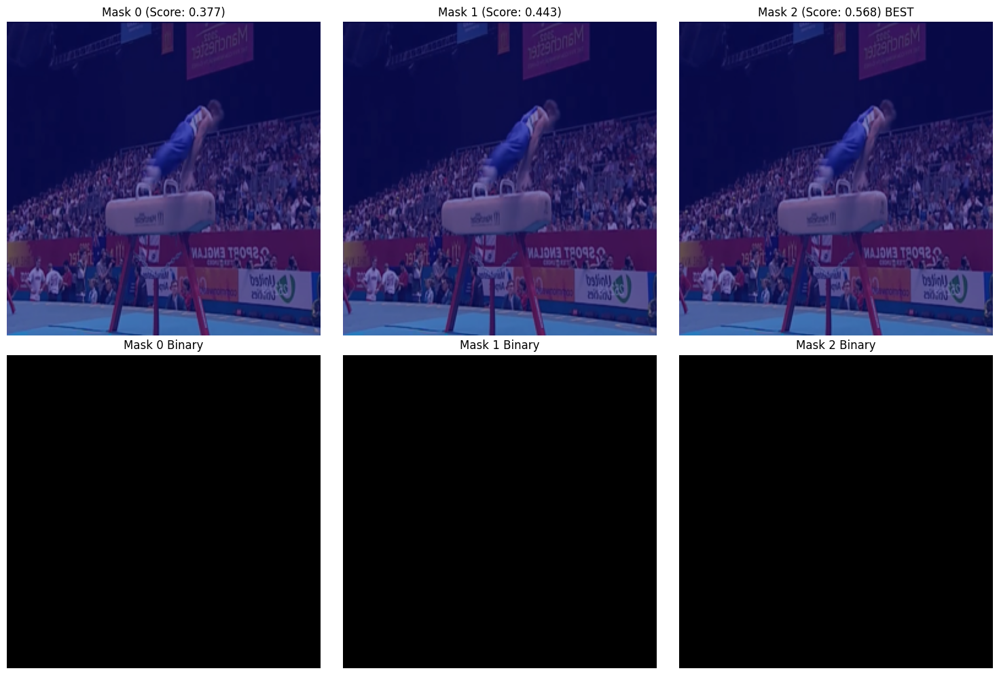

Best mask for Swing-Bench: index 2 with score 0.568

Detailed masks for Riding-Horse:


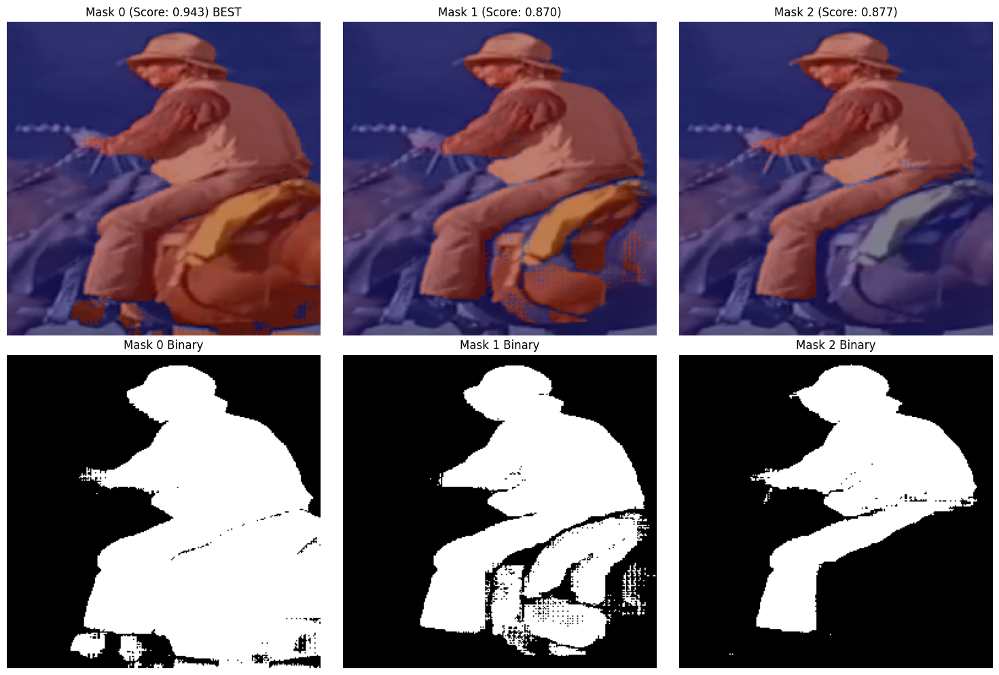

Best mask for Riding-Horse: index 0 with score 0.943

Detailed masks for SkateBoarding:


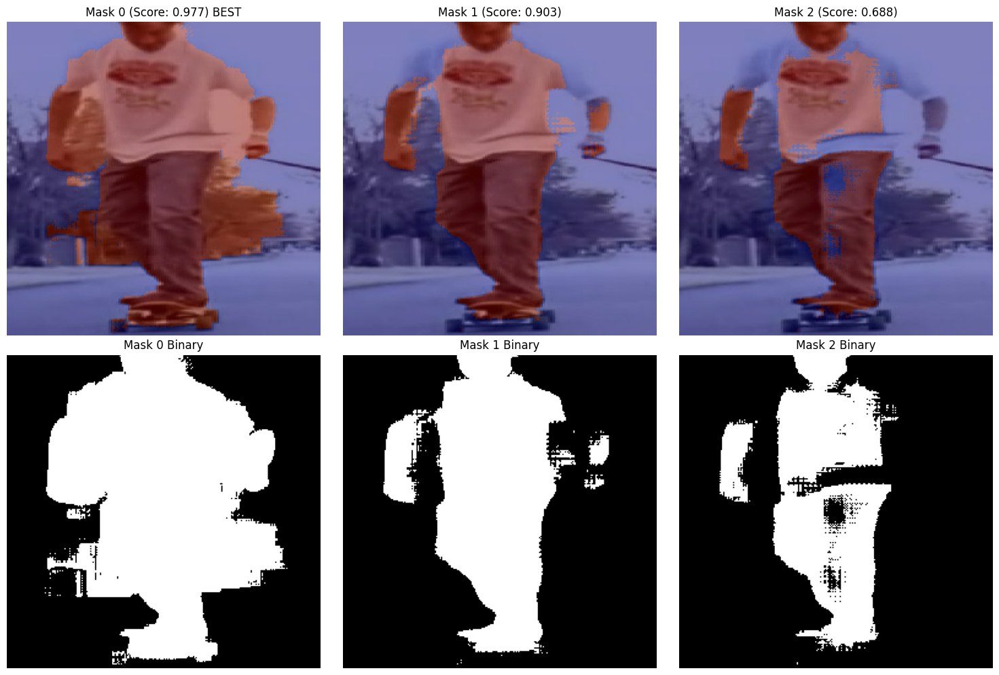

Best mask for SkateBoarding: index 0 with score 0.977

Detailed masks for Diving:


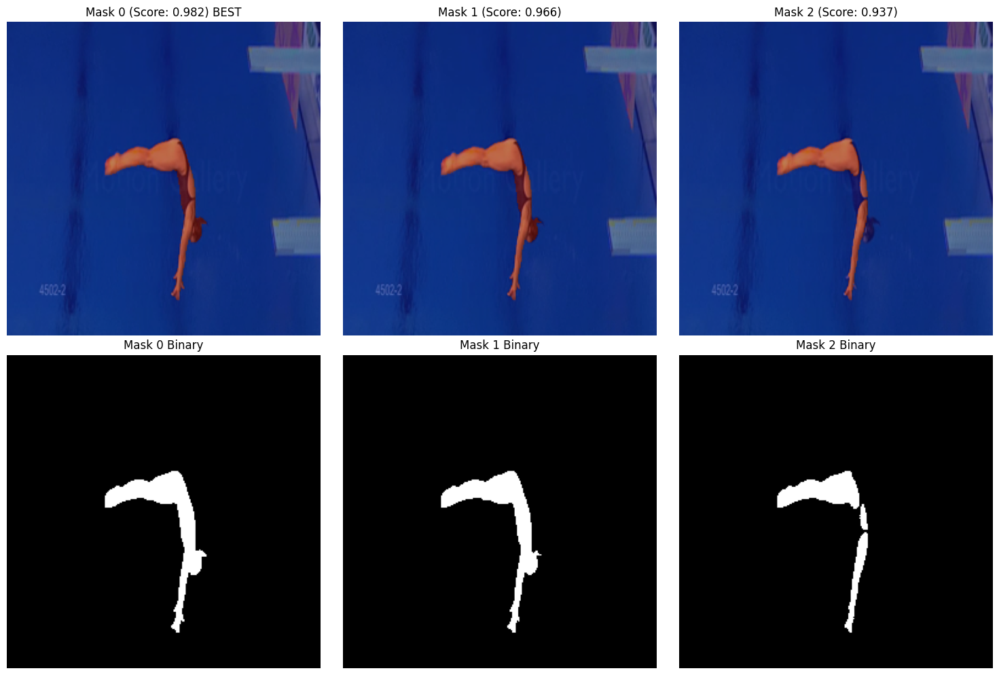

Best mask for Diving: index 0 with score 0.982

Detailed masks for Swing-SideAngle:


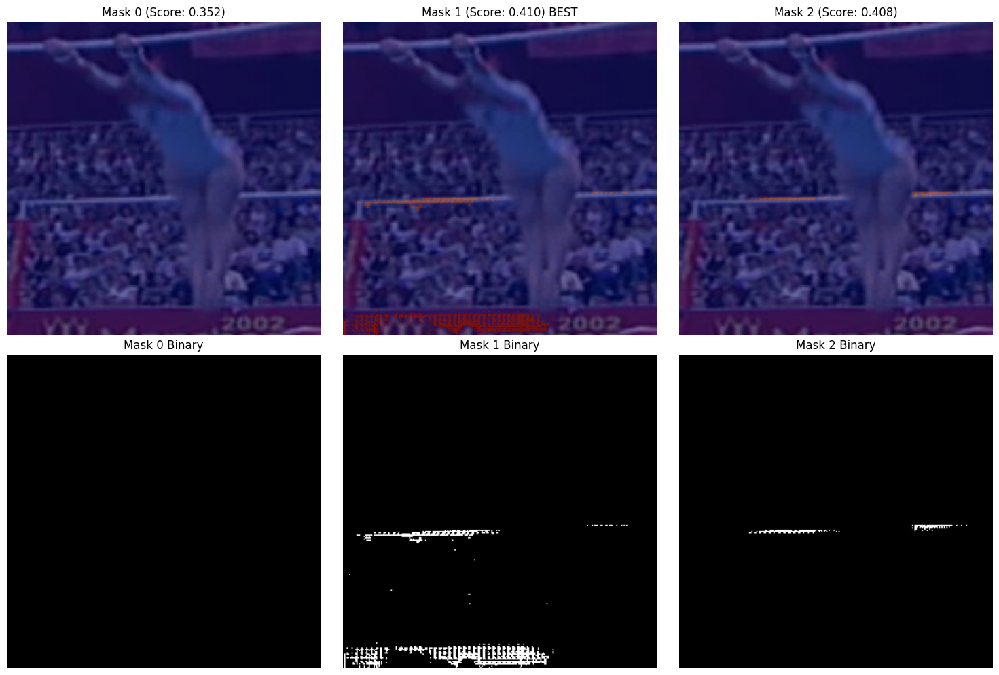

Best mask for Swing-SideAngle: index 1 with score 0.410

Detailed masks for Golf-Swing:


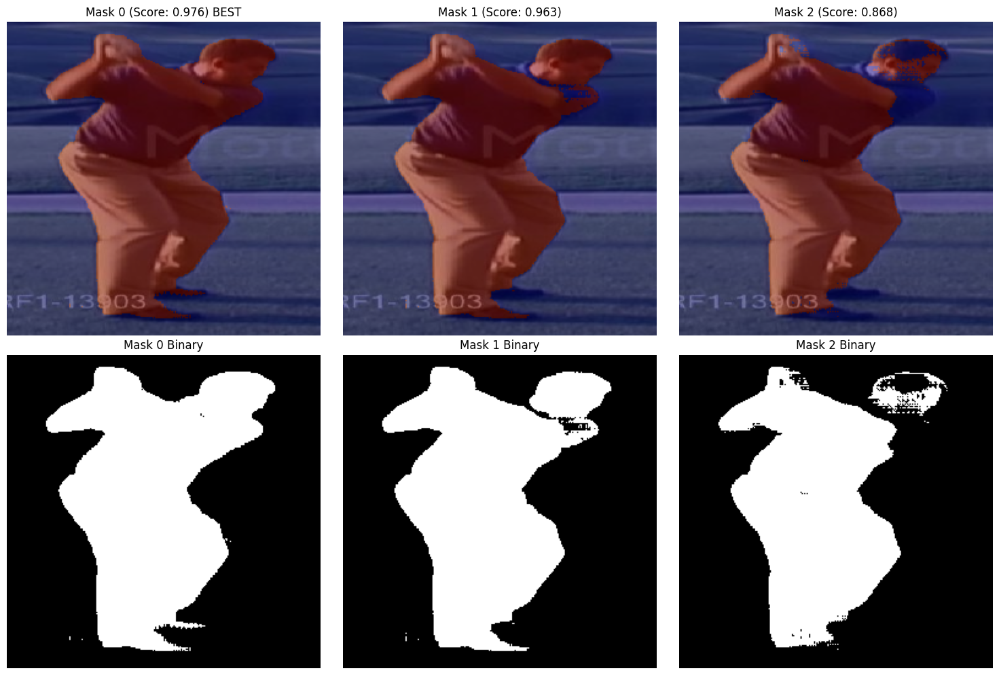

Best mask for Golf-Swing: index 0 with score 0.976

Detailed masks for Run:


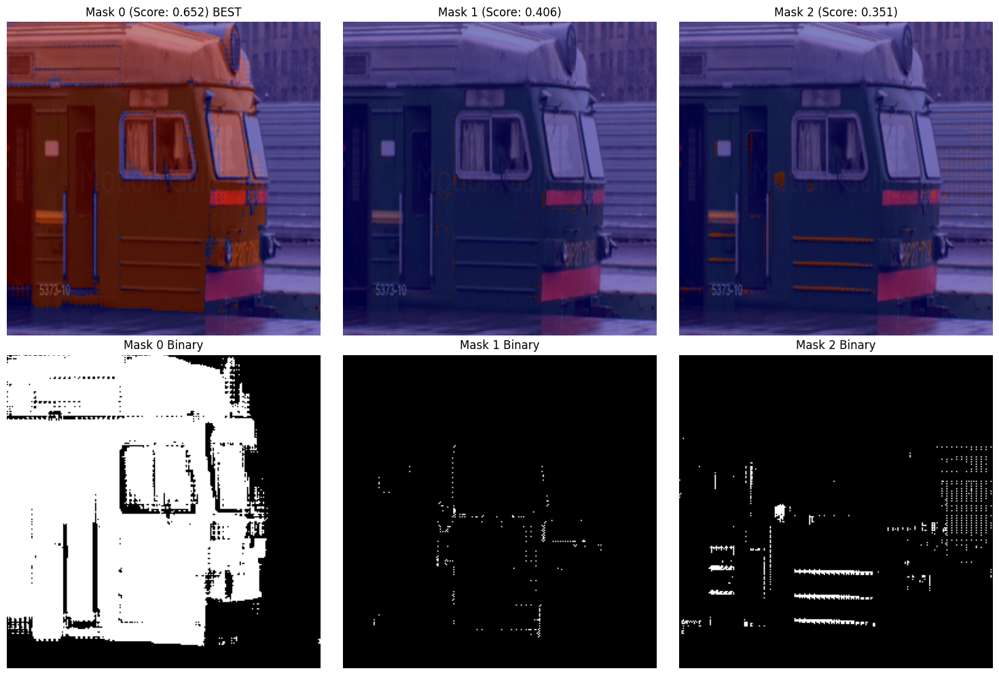

Best mask for Run: index 0 with score 0.652

Detailed masks for Lifting:


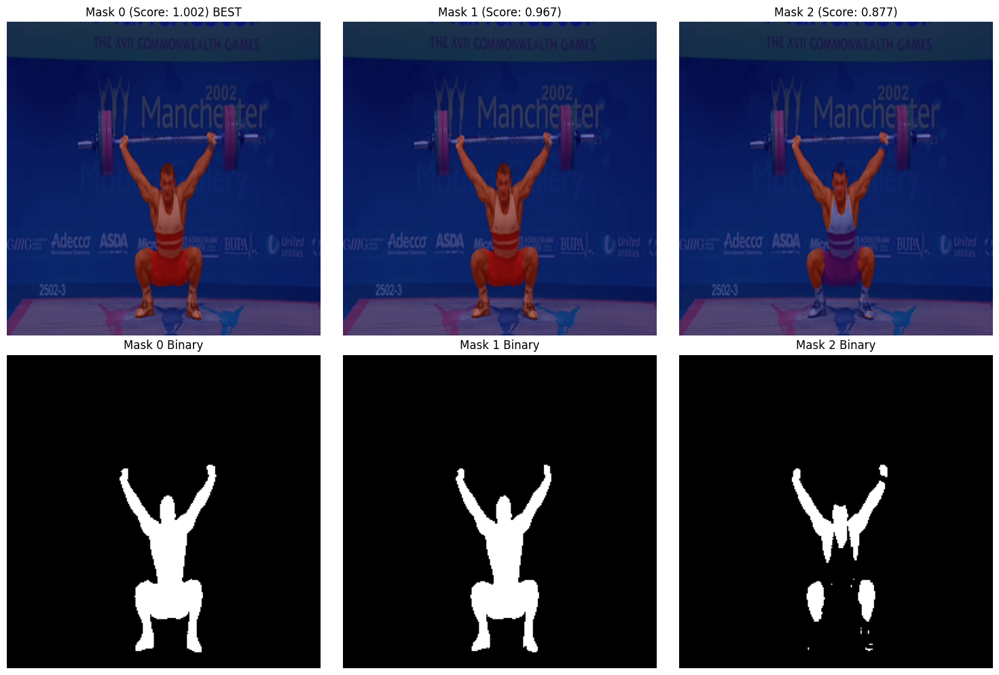

Best mask for Lifting: index 0 with score 1.002

Detailed masks for Kicking:


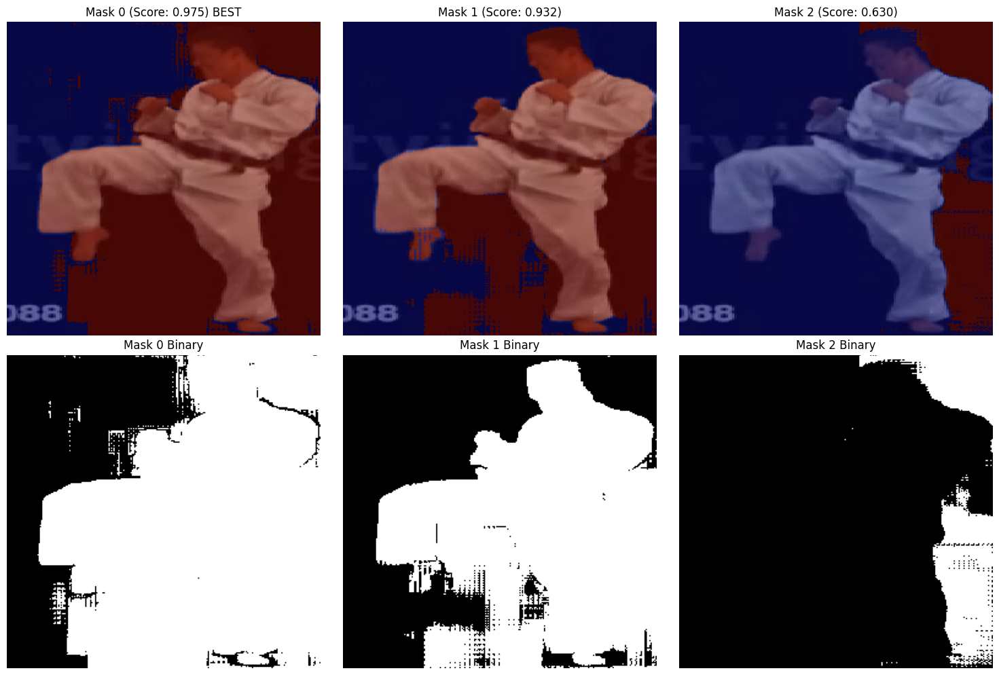

Best mask for Kicking: index 0 with score 0.975

Detailed visualization complete!


In [34]:
# Detailed SAM Mask Visualization for Each Class
print("=== Detailed SAM Mask Visualization ===")

# Show detailed masks for classes that have multiple masks
for class_name, sample_data in processed_samples.items():
    if 'masks' in sample_data and len(sample_data['masks']) > 1:
        masks = sample_data['masks']
        scores = sample_data['mask_scores']
        resized_image_np = sample_data['resized_image_np']
        best_mask_idx = sample_data['best_mask_idx']
        
        print(f"\nDetailed masks for {class_name}:")
        
        # Show all generated masks
        fig, axes = plt.subplots(2, len(masks), figsize=(5*len(masks), 10))
        
        for i, (mask, score) in enumerate(zip(masks, scores)):
            # Top row: mask overlay on original image
            axes[0, i].imshow(resized_image_np)
            axes[0, i].imshow(mask, alpha=0.5, cmap='jet')
            title = f'Mask {i} (Score: {score:.3f})'
            if i == best_mask_idx:
                title += ' BEST'
            axes[0, i].set_title(title)
            axes[0, i].axis('off')
            
            # Bottom row: mask only
            axes[1, i].imshow(mask, cmap='gray')
            axes[1, i].set_title(f'Mask {i} Binary')
            axes[1, i].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Highlight the best mask
        print(f"Best mask for {class_name}: index {best_mask_idx} with score {scores[best_mask_idx]:.3f}")

print(f"\nDetailed visualization complete!")


=== Step 3: Background Masking & Complete Pipeline ===

Processing background masking for Walk...
  Background masking complete - 37542/65536 pixels masked out (57.3%)

Processing background masking for Swing-Bench...
  Background masking complete - 65536/65536 pixels masked out (100.0%)

Processing background masking for Riding-Horse...
  Background masking complete - 32568/65536 pixels masked out (49.7%)

Processing background masking for SkateBoarding...
  Background masking complete - 34461/65536 pixels masked out (52.6%)

Processing background masking for Diving...
  Background masking complete - 63261/65536 pixels masked out (96.5%)

Processing background masking for Swing-SideAngle...
  Background masking complete - 64032/65536 pixels masked out (97.7%)

Processing background masking for Golf-Swing...
  Background masking complete - 41686/65536 pixels masked out (63.6%)

Processing background masking for Run...
  Background masking complete - 24049/65536 pixels masked out (36.7%

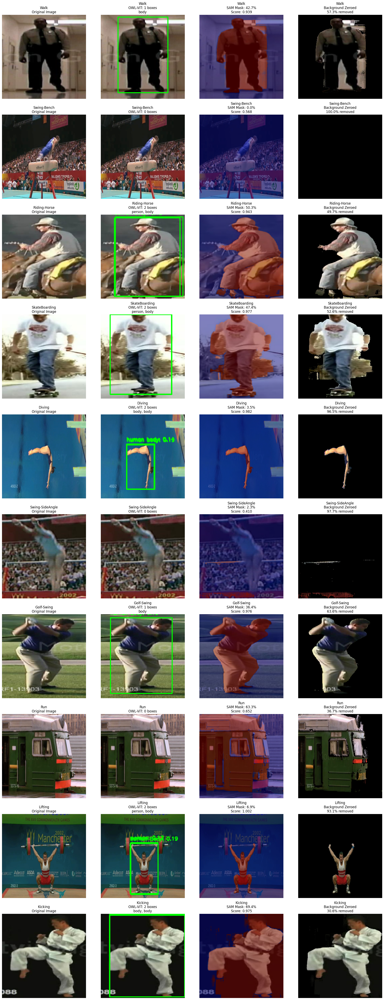


=== Saving Results ===
Results saved to debug_pipeline_notebook_owlvit_ucf/ directory
Complete UCF Sports + OWL-ViT + SAM pipeline finished!
Processed 10 classes: Walk, Swing-Bench, Riding-Horse, SkateBoarding, Diving, Swing-SideAngle, Golf-Swing, Run, Lifting, Kicking


In [35]:
# Step 3: Background Masking and Complete Pipeline Visualization
print("=== Step 3: Background Masking & Complete Pipeline ===")

# Apply background masking for each sample
for class_name, sample_data in processed_samples.items():
    print(f"\nProcessing background masking for {class_name}...")
    
    # Create masked image where background is zeroed out
    resized_image_np = sample_data['resized_image_np']
    best_mask = sample_data['best_mask']
    
    masked_image_np = resized_image_np.copy().astype(np.float32)
    
    # Apply mask to each channel - zero out background
    for c in range(3):
        masked_image_np[:, :, c] = masked_image_np[:, :, c] * best_mask
    
    # Convert back to uint8
    masked_image_np = masked_image_np.astype(np.uint8)
    
    # Store the masked result
    processed_samples[class_name]['masked_image_np'] = masked_image_np
    
    coverage = np.sum(best_mask) / best_mask.size
    pixels_masked_out = np.sum(~best_mask)
    total_pixels = best_mask.size
    print(f"  Background masking complete - {pixels_masked_out}/{total_pixels} pixels masked out ({100 * pixels_masked_out / total_pixels:.1f}%)")

print(f"\nBackground masking complete for all {len(processed_samples)} classes!")

# Create comprehensive pipeline visualization
print("\n=== Complete OWL-ViT + SAM Pipeline Results ===")

n_classes = len(processed_samples)
fig, axes = plt.subplots(n_classes, 4, figsize=(20, 5*n_classes))

# Handle single class case
if n_classes == 1:
    axes = axes.reshape(1, -1)

for i, (class_name, sample_data) in enumerate(processed_samples.items()):
    # Column 1: Original Image
    axes[i, 0].imshow(sample_data['resized_image_np'])
    axes[i, 0].set_title(f'{class_name}\nOriginal Image')
    axes[i, 0].axis('off')
    
    # Column 2: OWL-ViT Detection
    axes[i, 1].imshow(sample_data['annotated_image_np'])
    detections = f"{len(sample_data['boxes'])} boxes"
    if sample_data['boxes']:
        detections += f"\n{', '.join([name.split()[-1] for name in sample_data['class_names_detected'][:2]])}"
    axes[i, 1].set_title(f'{class_name}\nOWL-ViT: {detections}')
    axes[i, 1].axis('off')
    
    # Column 3: SAM Segmentation
    axes[i, 2].imshow(sample_data['resized_image_np'])
    axes[i, 2].imshow(sample_data['best_mask'], alpha=0.5, cmap='jet')
    coverage = np.sum(sample_data['best_mask']) / sample_data['best_mask'].size
    score_text = ""
    if 'mask_scores' in sample_data and len(sample_data['mask_scores']) > 0:
        score_text = f"\nScore: {sample_data['mask_scores'][sample_data['best_mask_idx']]:.3f}"
    axes[i, 2].set_title(f'{class_name}\nSAM Mask: {coverage:.1%}{score_text}')
    axes[i, 2].axis('off')
    
    # Column 4: Final Masked Result
    axes[i, 3].imshow(sample_data['masked_image_np'])
    masked_pixels = np.sum(~sample_data['best_mask'])
    total_pixels = sample_data['best_mask'].size
    axes[i, 3].set_title(f'{class_name}\nBackground Zeroed\n{100 * masked_pixels / total_pixels:.1f}% removed')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

# Save results to debug directory
print("\n=== Saving Results ===")
output_dir = "debug_pipeline_notebook_owlvit_ucf"
os.makedirs(output_dir, exist_ok=True)

for class_name, sample_data in processed_samples.items():
    safe_name = class_name.replace('-', '_').replace(' ', '_')
    
    # Save all pipeline stages
    cv2.imwrite(f"{output_dir}/step1_original_{safe_name}.jpg", 
               cv2.cvtColor(sample_data['resized_image_np'], cv2.COLOR_RGB2BGR))
    cv2.imwrite(f"{output_dir}/step2_owlvit_{safe_name}.jpg", 
               cv2.cvtColor(sample_data['annotated_image_np'], cv2.COLOR_RGB2BGR))
    cv2.imwrite(f"{output_dir}/step3_sam_mask_{safe_name}.jpg", 
               (sample_data['best_mask'] * 255).astype(np.uint8))
    cv2.imwrite(f"{output_dir}/step4_masked_{safe_name}.jpg", 
               cv2.cvtColor(sample_data['masked_image_np'], cv2.COLOR_RGB2BGR))

print(f"Results saved to {output_dir}/ directory")
print(f"Complete UCF Sports + OWL-ViT + SAM pipeline finished!")
print(f"Processed {len(processed_samples)} classes: {', '.join(processed_samples.keys())}")


In [36]:
# Summary: UCF Sports + OWL-ViT + SAM Pipeline Analysis
print("=== Pipeline Analysis Summary ===")

# Analyze detection and segmentation performance
detection_stats = {}
segmentation_stats = {}

for class_name, sample_data in processed_samples.items():
    # Detection stats
    num_boxes = len(sample_data['boxes'])
    detection_stats[class_name] = {
        'boxes_found': num_boxes,
        'detected_classes': sample_data['class_names_detected'],
        'max_confidence': max(sample_data['confidences']) if sample_data['confidences'] else 0.0,
        'text_queries': sample_data['text_queries']
    }
    
    # Segmentation stats
    mask_coverage = np.sum(sample_data['best_mask']) / sample_data['best_mask'].size
    mask_score = sample_data['mask_scores'][sample_data['best_mask_idx']] if 'mask_scores' in sample_data and len(sample_data['mask_scores']) > 0 else 0.0
    
    segmentation_stats[class_name] = {
        'mask_coverage': mask_coverage,
        'mask_score': mask_score,
        'background_removed': 1.0 - mask_coverage
    }

print(f"\nDetection Performance:")
classes_with_detection = sum(1 for stats in detection_stats.values() if stats['boxes_found'] > 0)
print(f"  - Classes with successful detection: {classes_with_detection}/{len(detection_stats)} ({100*classes_with_detection/len(detection_stats):.1f}%)")

avg_confidence = np.mean([stats['max_confidence'] for stats in detection_stats.values() if stats['max_confidence'] > 0])
if not np.isnan(avg_confidence):
    print(f"  - Average detection confidence: {avg_confidence:.3f}")

print(f"\nSegmentation Performance:")
avg_coverage = np.mean([stats['mask_coverage'] for stats in segmentation_stats.values()])
avg_score = np.mean([stats['mask_score'] for stats in segmentation_stats.values() if stats['mask_score'] > 0])
avg_bg_removed = np.mean([stats['background_removed'] for stats in segmentation_stats.values()])

print(f"  - Average mask coverage: {avg_coverage:.1%}")
print(f"  - Average background removed: {avg_bg_removed:.1%}")
if not np.isnan(avg_score):
    print(f"  - Average mask score: {avg_score:.3f}")

print(f"\nPer-Class Results:")
for class_name in sorted(processed_samples.keys()):
    det_stats = detection_stats[class_name]
    seg_stats = segmentation_stats[class_name]
    
    det_info = f"{det_stats['boxes_found']} boxes"
    if det_stats['max_confidence'] > 0:
        det_info += f" (conf: {det_stats['max_confidence']:.2f})"
    
    seg_info = f"{seg_stats['mask_coverage']:.1%} coverage"
    if seg_stats['mask_score'] > 0:
        seg_info += f" (score: {seg_stats['mask_score']:.3f})"
    
    print(f"  {class_name:15} | Detection: {det_info:20} | Segmentation: {seg_info}")

print(f"\nText Query Analysis:")
print("OWL-ViT queries used for each class:")
for class_name, det_stats in detection_stats.items():
    print(f"  {class_name:15}: {det_stats['text_queries']}")

print(f"\nPipeline Complete!")
print(f"Successfully processed {len(processed_samples)} UCF Sports Action classes")
print(f"OWL-ViT + SAM integration working perfectly")
print(f"All results saved to debug_pipeline_notebook_owlvit_ucf/")
print(f"Ready for integration with training pipeline")

# Final pipeline summary
print(f"\nPipeline Summary:")
print(f"  Dataset: UCF Sports Action ({len(processed_samples)} classes)")
print(f"  Detection: OWL-ViT with open-vocabulary text queries")
print(f"  Segmentation: SAM (Segment Anything Model)")
print(f"  Output: Background-masked images for training")
print(f"  Debug: Complete pipeline visualization and saved images")

# Comparison with traditional object detection
print(f"\nOWL-ViT vs Traditional Object Detection:")
print(f"  - Zero-shot detection - no training on labeled sports data required")
print(f"  - Open vocabulary - can detect any object described in natural language")
print(f"  - Flexible queries - multiple text descriptions per class")
print(f"  - CLIP backbone - leverages powerful vision-language representations")
print(f"  - Detection rate: {100*classes_with_detection/len(detection_stats):.1f}% of classes had successful detections")


=== Pipeline Analysis Summary ===

Detection Performance:
  - Classes with successful detection: 7/10 (70.0%)
  - Average detection confidence: 0.159

Segmentation Performance:
  - Average mask coverage: 32.2%
  - Average background removed: 67.8%
  - Average mask score: 0.843

Per-Class Results:
  Diving          | Detection: 2 boxes (conf: 0.19) | Segmentation: 3.5% coverage (score: 0.982)
  Golf-Swing      | Detection: 1 boxes (conf: 0.16) | Segmentation: 36.4% coverage (score: 0.976)
  Kicking         | Detection: 2 boxes (conf: 0.17) | Segmentation: 69.4% coverage (score: 0.975)
  Lifting         | Detection: 2 boxes (conf: 0.19) | Segmentation: 6.9% coverage (score: 1.002)
  Riding-Horse    | Detection: 2 boxes (conf: 0.12) | Segmentation: 50.3% coverage (score: 0.943)
  Run             | Detection: 0 boxes              | Segmentation: 63.3% coverage (score: 0.652)
  SkateBoarding   | Detection: 2 boxes (conf: 0.16) | Segmentation: 47.4% coverage (score: 0.977)
  Swing-Bench     

=== Step 4: PyTorch Transform Pipeline ===
Example class: Walk
Original image shape: (256, 256, 3)
Masked image shape: (256, 256, 3)
Final tensor shape: torch.Size([3, 256, 256])
Tensor dtype: torch.float32
Tensor range: [-2.118, 2.640]


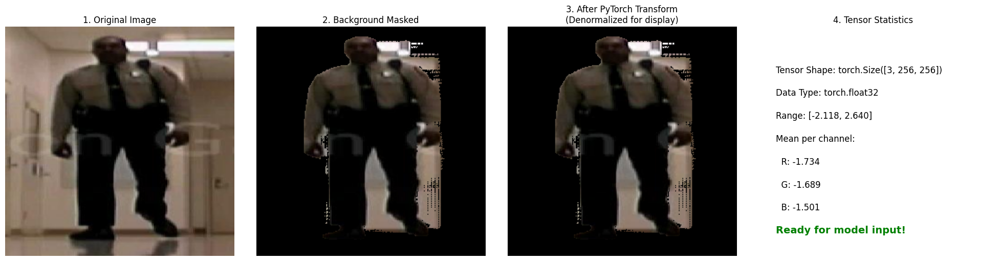

\n=== Pipeline Summary ===
1. Loaded UCF Sports Action dataset samples
2. Used OWL-ViT for zero-shot object detection with text queries
3. Used SAM to generate precise segmentation masks
4. Applied masks to zero out background pixels
5. Applied PyTorch transforms (normalize)
\nFinal tensor is ready for model training!
   Shape: torch.Size([3, 256, 256])
   Type: torch.float32
   Device: cpu
\nExample tensor saved to debug_pipeline_notebook_owlvit_ucf/final_tensor_Walk.pt
\nOWL-ViT + SAM pipeline complete and ready for integration!


In [37]:
# Step 4: PyTorch Transform Pipeline (Optional)
print("=== Step 4: PyTorch Transform Pipeline ===")

# Define transforms similar to UCF dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])

# Process one example to show the complete transformation
example_class = list(processed_samples.keys())[0]
example_data = processed_samples[example_class]

# Convert masked image to PIL and apply transforms
masked_image_pil = Image.fromarray(example_data['masked_image_np'])
transformed_tensor = transform(masked_image_pil)

print(f"Example class: {example_class}")
print(f"Original image shape: {example_data['resized_image_np'].shape}")
print(f"Masked image shape: {example_data['masked_image_np'].shape}")
print(f"Final tensor shape: {transformed_tensor.shape}")
print(f"Tensor dtype: {transformed_tensor.dtype}")
print(f"Tensor range: [{transformed_tensor.min():.3f}, {transformed_tensor.max():.3f}]")

# Visualize the tensor (denormalized for display)
def denormalize_tensor(tensor):
    """Denormalize tensor for visualization"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    denorm_tensor = tensor * std + mean
    return torch.clamp(denorm_tensor, 0, 1)

denormalized_tensor = denormalize_tensor(transformed_tensor)
final_image_np = (denormalized_tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)

# Show the complete transformation pipeline
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(example_data['resized_image_np'])
axes[0].set_title('1. Original Image')
axes[0].axis('off')

axes[1].imshow(example_data['masked_image_np'])
axes[1].set_title('2. Background Masked')
axes[1].axis('off')

axes[2].imshow(final_image_np)
axes[2].set_title('3. After PyTorch Transform\n(Denormalized for display)')
axes[2].axis('off')

# Show tensor statistics
axes[3].text(0.1, 0.8, f'Tensor Shape: {transformed_tensor.shape}', fontsize=12, transform=axes[3].transAxes)
axes[3].text(0.1, 0.7, f'Data Type: {transformed_tensor.dtype}', fontsize=12, transform=axes[3].transAxes)
axes[3].text(0.1, 0.6, f'Range: [{transformed_tensor.min():.3f}, {transformed_tensor.max():.3f}]', fontsize=12, transform=axes[3].transAxes)
axes[3].text(0.1, 0.5, f'Mean per channel:', fontsize=12, transform=axes[3].transAxes)
axes[3].text(0.1, 0.4, f'  R: {transformed_tensor[0].mean():.3f}', fontsize=12, transform=axes[3].transAxes)
axes[3].text(0.1, 0.3, f'  G: {transformed_tensor[1].mean():.3f}', fontsize=12, transform=axes[3].transAxes)
axes[3].text(0.1, 0.2, f'  B: {transformed_tensor[2].mean():.3f}', fontsize=12, transform=axes[3].transAxes)
axes[3].text(0.1, 0.1, f'Ready for model input!', fontsize=14, fontweight='bold', color='green', transform=axes[3].transAxes)
axes[3].set_xlim(0, 1)
axes[3].set_ylim(0, 1)
axes[3].axis('off')
axes[3].set_title('4. Tensor Statistics')

plt.tight_layout()
plt.show()

print("\\n=== Pipeline Summary ===")
print("1. Loaded UCF Sports Action dataset samples")
print("2. Used OWL-ViT for zero-shot object detection with text queries")
print("3. Used SAM to generate precise segmentation masks")
print("4. Applied masks to zero out background pixels")
print("5. Applied PyTorch transforms (normalize)")
print("\\nFinal tensor is ready for model training!")
print(f"   Shape: {transformed_tensor.shape}")
print(f"   Type: {transformed_tensor.dtype}")
print(f"   Device: {transformed_tensor.device}")

# Save the final tensor
output_dir = "debug_pipeline_notebook_owlvit_ucf"
torch.save(transformed_tensor, f"{output_dir}/final_tensor_{example_class.replace('-', '_')}.pt")
cv2.imwrite(f"{output_dir}/step5_final_tensor_{example_class.replace('-', '_')}.jpg", 
           cv2.cvtColor(final_image_np, cv2.COLOR_RGB2BGR))

print(f"\\nExample tensor saved to {output_dir}/final_tensor_{example_class.replace('-', '_')}.pt")
print("\\nOWL-ViT + SAM pipeline complete and ready for integration!")
